# Text Document Clustering

## Definition of the Problem

In order to understand the practical application of Text Document Clustering we must first understand the problem we are trying to solve

The problem in question would be the existance of large bodies of text, that we would like to segment and categorize according to similaraties in context and subject matter.

Considering the fact that most of the data, text included, that has ever been generated by humanity has been generated in the last 30 years, and most of it is 
unlabled and uncathegorized this is a very much present problem and increasing with the pasage of time 

The purpose of this article is to show the effectivenes of machine learnig in obtaining a usefull categorization of text so that finding the subject of interest is easier and faster than it would be lacking a clear categorization.

For that purpose we shall be using several data sources:
- NPR News Articles https://www.npr.org/
- Drug Side Effects https://www.kaggle.com/datasets/jithinanievarghese/drugs-side-effects-and-medical-condition
- Spotify Million Song Dataset https://www.kaggle.com/datasets/notshrirang/spotify-million-song-dataset
- Twitter Financial News https://www.kaggle.com/datasets/sulphatet/twitter-financial-news

As it can be noticed these data source are varied in data and subject matter. We intend to see if we can find a good category for the text data present in these data sources.

## Libraries and Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF

# NPR

In [42]:
npr = pd.read_csv('npr.csv')
npr.head()

,Article
0,"In the Washington of 2016, even when the polic..."
1,Donald Trump has used Twitter — his prefe...
2,Donald Trump is unabashedly praising Russian...
3,"Updated at 2:50 p. m. ET, Russian President Vl..."
4,"From photography, illustration and video, to d..."


Of course there is no topic to the artical or category for that matter thus we would need to set it ourselves 

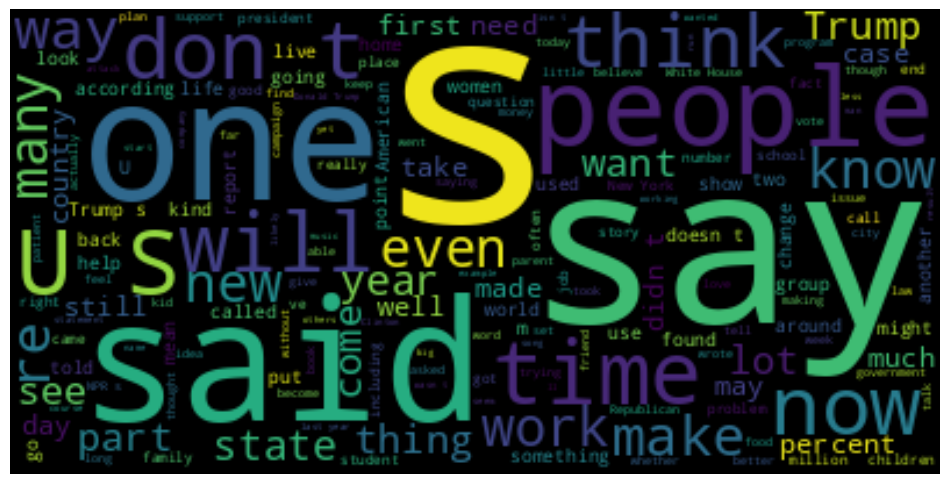

In [43]:
# Get all the text
text =  npr.Article.to_list()
text = ' '.join(text)
wordcloud = WordCloud().generate(text)

# Plot Word Cloud
plt.figure(figsize=(12,8), dpi=100)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");

## Preprocessing

**`max_df`**` : float in range [0.0, 1.0] or int, default=1.0`<br>
When building the vocabulary ignore terms that have a document frequency strictly higher than the given threshold (corpus-specific stop words). If float, the parameter represents a proportion of documents, integer absolute counts. This parameter is ignored if vocabulary is not None.

**`min_df`**` : float in range [0.0, 1.0] or int, default=1`<br>
When building the vocabulary ignore terms that have a document frequency strictly lower than the given threshold. This value is also called cut-off in the literature. If float, the parameter represents a proportion of documents, integer absolute counts. This parameter is ignored if vocabulary is not None.

In [73]:
cv = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = cv.fit_transform(npr['Article'])

In [45]:
# tfidf = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
# dtm = tfidf.fit_transform(npr['Article'])

## Fitting the Data

### LDA

In [74]:
LDA = LatentDirichletAllocation(n_components=7
                                , random_state=42
                                , n_jobs=-1
                                , verbose=1
                                , max_iter=20).fit(dtm)

iteration: 1 of max_iter: 20
iteration: 2 of max_iter: 20
iteration: 3 of max_iter: 20
iteration: 4 of max_iter: 20
iteration: 5 of max_iter: 20
iteration: 6 of max_iter: 20
iteration: 7 of max_iter: 20
iteration: 8 of max_iter: 20
iteration: 9 of max_iter: 20
iteration: 10 of max_iter: 20
iteration: 11 of max_iter: 20
iteration: 12 of max_iter: 20
iteration: 13 of max_iter: 20
iteration: 14 of max_iter: 20
iteration: 15 of max_iter: 20
iteration: 16 of max_iter: 20
iteration: 17 of max_iter: 20
iteration: 18 of max_iter: 20
iteration: 19 of max_iter: 20
iteration: 20 of max_iter: 20


In [75]:
print(len(cv.get_feature_names_out()), LDA.components_[0].shape)
keys = cv.get_feature_names_out()

54777 (54777,)


In [76]:
topics = []
for topic in LDA.components_:
    d  = {}
    for key, value in zip(keys, topic):
        d[key] = value
    topics.append(d)

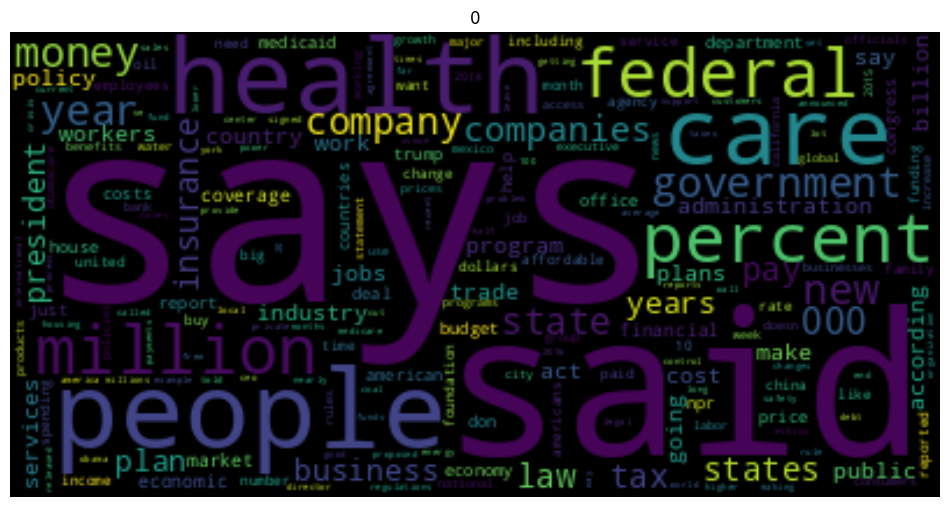

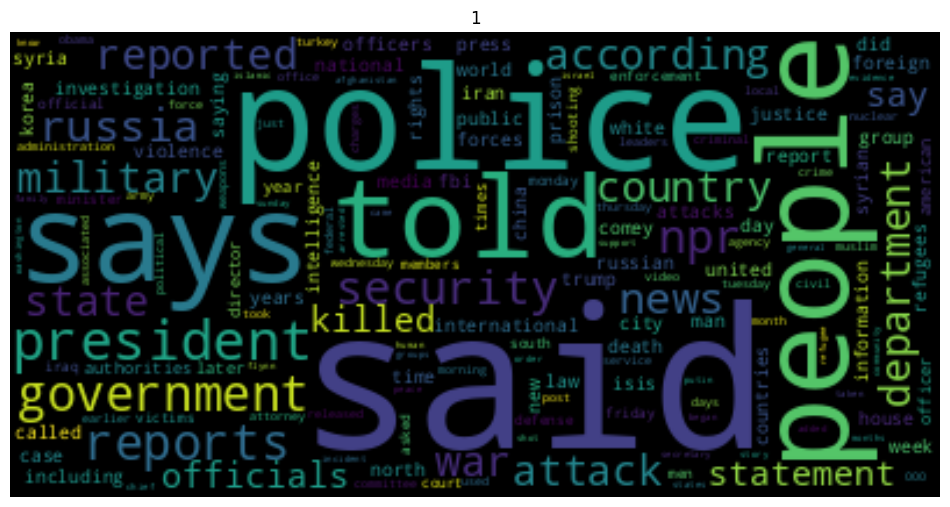

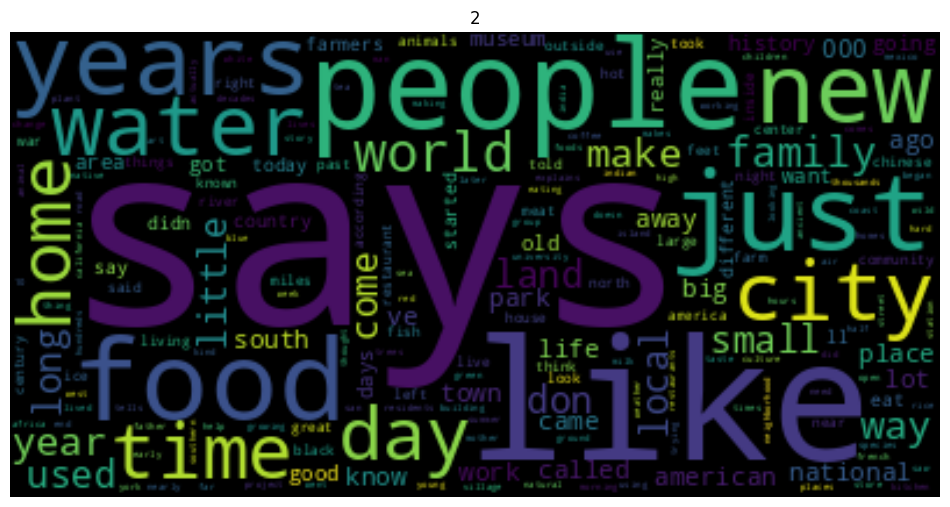

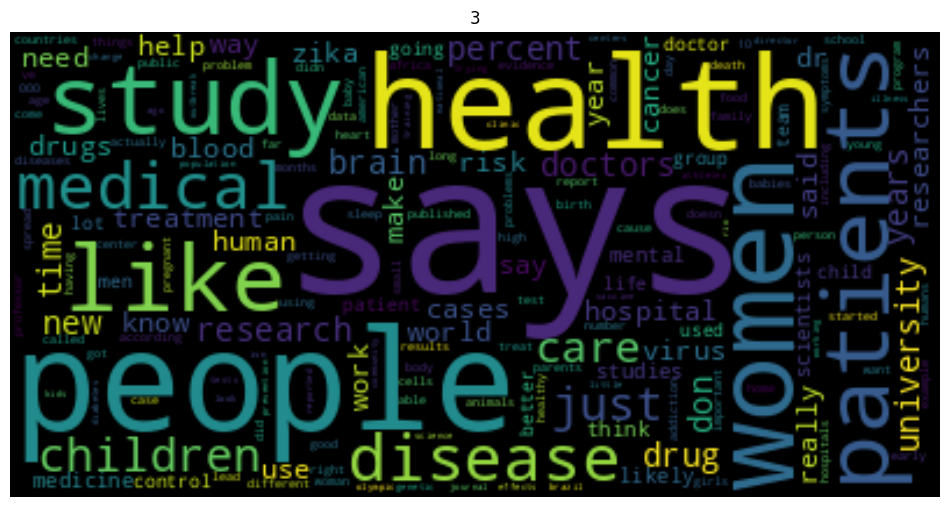

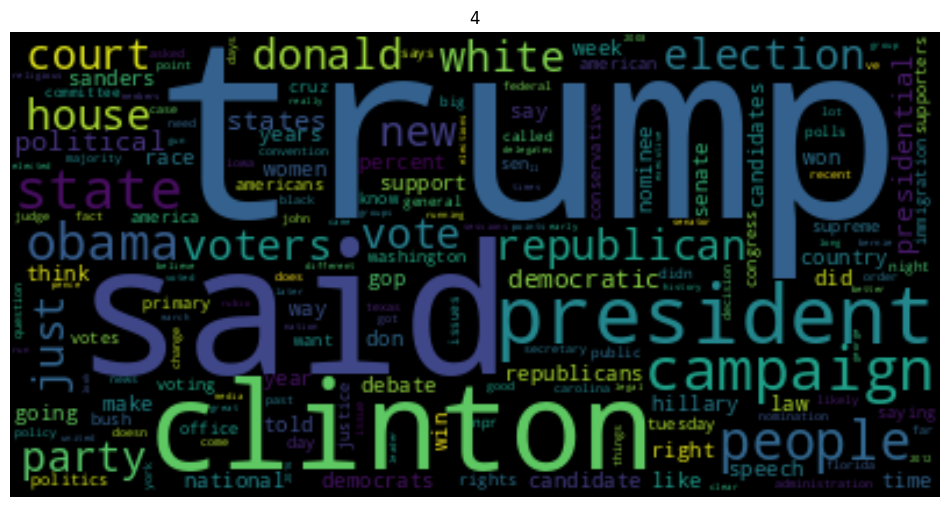

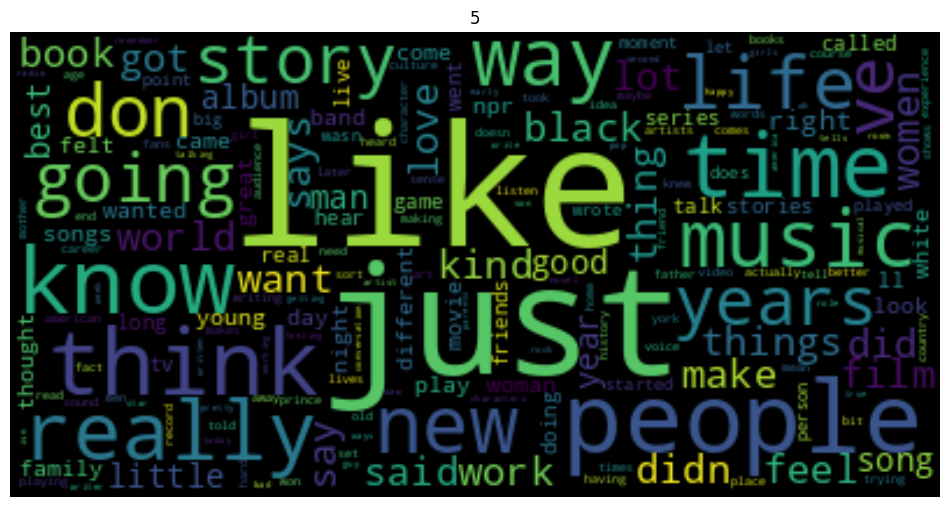

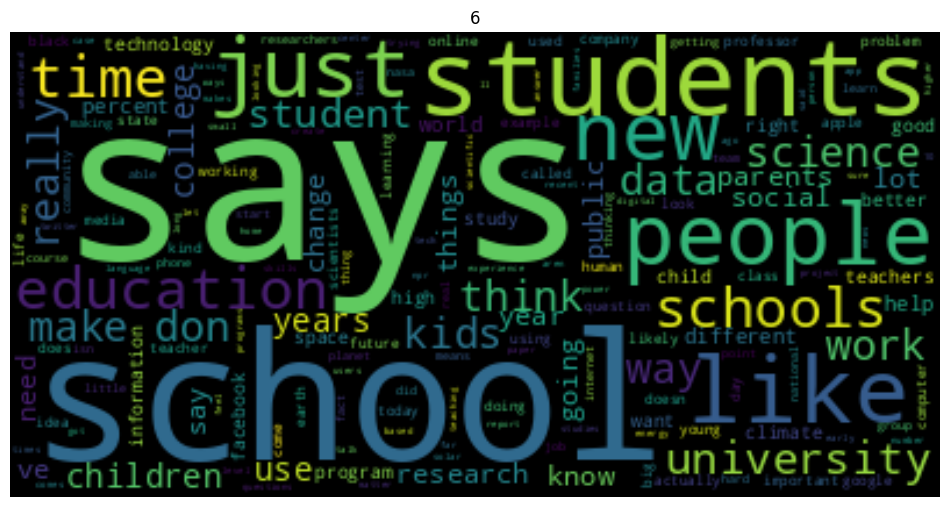

In [77]:
n=0
for topic in topics:
    wordcloud = WordCloud()
    wordcloud.generate_from_frequencies(topic)
    plt.figure(figsize=(12,8), dpi=100)
    plt.title(n)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");
    n=n+1

In [78]:
for topic in LDA.components_:
    print(keys[topic.argsort()][-20:])

['pay' 'law' 'tax' 'insurance' 'companies' 'state' '000' 'company' 'money'
 'year' 'new' 'government' 'million' 'federal' 'percent' 'care' 'health'
 'people' 'said' 'says']
['state' 'attack' 'country' 'war' 'military' 'department' 'according'
 'reported' 'news' 'russia' 'security' 'npr' 'reports' 'government'
 'president' 'told' 'people' 'says' 'police' 'said']
['don' 'little' 'small' 'way' 'year' 'make' 'family' 'world' 'home' 'day'
 'time' 'city' 'water' 'new' 'years' 'just' 'food' 'people' 'like' 'says']
['university' 'time' 'research' 'years' 'drug' 'new' 'don' 'percent'
 'care' 'just' 'children' 'medical' 'disease' 'like' 'patients' 'study'
 'women' 'health' 'people' 'says']
['political' 'voters' 'just' 'donald' 'vote' 'court' 'party' 'new' 'house'
 'white' 'election' 'republican' 'obama' 'people' 'state' 'campaign'
 'president' 'clinton' 'said' 'trump']
['book' 'said' 'world' 'things' 've' 'story' 'going' 'years' 'don' 'life'
 'music' 'new' 'way' 'really' 'time' 'think' 'know' 'p

In [79]:
npr['topic_raw'] = LDA.transform(dtm).argmax(axis=1)

In [83]:
topics = {0: 'Finance'
          , 1: 'International News'
          , 2: 'Cultural'
          , 3: 'Medical Research'
          , 4: 'Presidential Election'
          , 5: 'Cultural News'
          , 6: 'Education'
         }

In [84]:
npr['topic'] = npr.topic_raw.apply(lambda x: topics[x])

In [85]:
sample =  npr.sample(2)
for topic, article in zip(sample.topic, sample.Article):
    print(topic)
    print(article, end='\n\n')

Cultural
For the last 10 years, on the eve of Passover, the Federman family has loaded a young male goat into their car and driven from their farm in a West Bank Jewish community to the Old City of Jerusalem, where they hoped to slaughter the animal in the ritual sacrifice prescribed in the Bible. The family is not alone in its mission. The number of Israeli Jews approaching Jerusalem with goats prepared for sacrifice has been growing in recent years, according to the Federmans. ”Thank God, more people are trying to carry out this commandment,” said Elisheva Federman, who has a herd of about 15 goats. Whenever a male goat is born, she does not vaccinate or brand it because that would make it ineligible to be sacrificed. According to the Book of Leviticus, an offering must be ”a male without blemish.” But each year, police prevent the Federmans and others from slaughtering goats on Jerusalem’s Temple Mount. They fear such an act on this site, sacred to Jews for once housing the ancient 

# Spotify

In [86]:
data = pd.read_csv('spotify_millsongdata.csv')
data.head()

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...


In [87]:
text_data = data.text

Of course there is no topic to the artical or category for that matter thus we would need to set it ourselves 

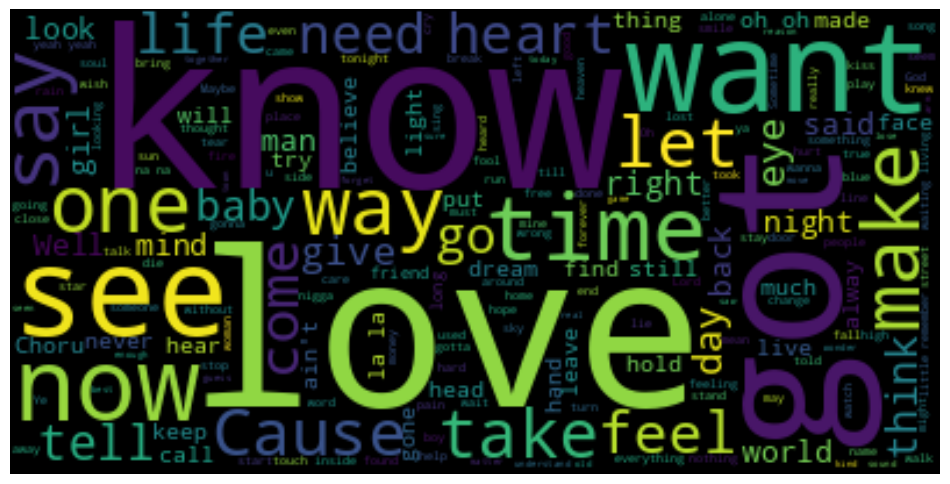

In [88]:
# Get all the text
text =  data.text.to_list()
text = ' '.join(text)
wordcloud = WordCloud().generate(text)

# Plot Word Cloud
plt.figure(figsize=(12,8), dpi=100)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");

## Preprocessing

**`max_df`**` : float in range [0.0, 1.0] or int, default=1.0`<br>
When building the vocabulary ignore terms that have a document frequency strictly higher than the given threshold (corpus-specific stop words). If float, the parameter represents a proportion of documents, integer absolute counts. This parameter is ignored if vocabulary is not None.

**`min_df`**` : float in range [0.0, 1.0] or int, default=1`<br>
When building the vocabulary ignore terms that have a document frequency strictly lower than the given threshold. This value is also called cut-off in the literature. If float, the parameter represents a proportion of documents, integer absolute counts. This parameter is ignored if vocabulary is not None.

In [89]:
cv = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = cv.fit_transform(text_data)

## Fitting the Data

### LDA

In [90]:
LDA = LatentDirichletAllocation(n_components=7
                                , random_state=42
                                , n_jobs=-1
                                , verbose=1
                                , max_iter=20).fit(dtm)

iteration: 1 of max_iter: 20
iteration: 2 of max_iter: 20
iteration: 3 of max_iter: 20
iteration: 4 of max_iter: 20
iteration: 5 of max_iter: 20
iteration: 6 of max_iter: 20
iteration: 7 of max_iter: 20
iteration: 8 of max_iter: 20
iteration: 9 of max_iter: 20
iteration: 10 of max_iter: 20
iteration: 11 of max_iter: 20
iteration: 12 of max_iter: 20
iteration: 13 of max_iter: 20
iteration: 14 of max_iter: 20
iteration: 15 of max_iter: 20
iteration: 16 of max_iter: 20
iteration: 17 of max_iter: 20
iteration: 18 of max_iter: 20
iteration: 19 of max_iter: 20
iteration: 20 of max_iter: 20


In [91]:
print(len(cv.get_feature_names_out()), LDA.components_[0].shape)
keys = cv.get_feature_names_out()

40546 (40546,)


In [92]:
topics = []
for topic in LDA.components_:
    d  = {}
    for key, value in zip(keys, topic):
        d[key] = value
    topics.append(d)

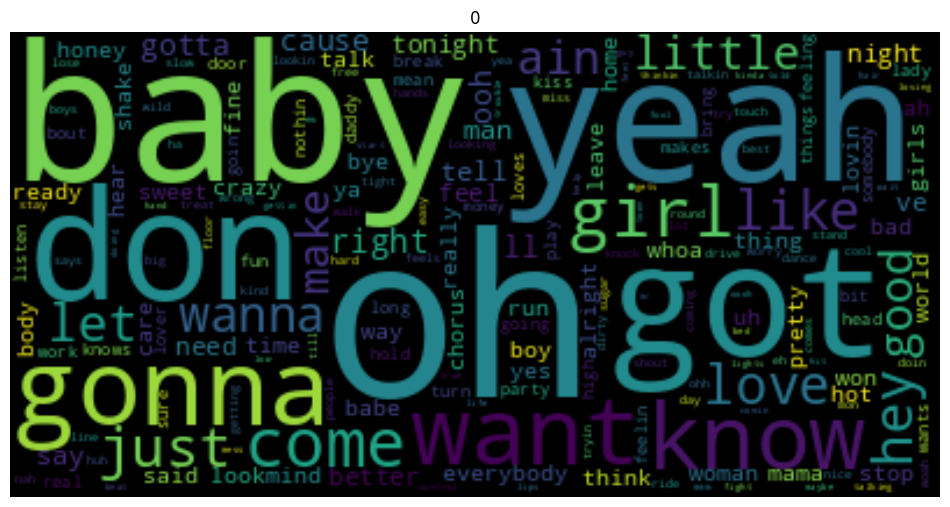

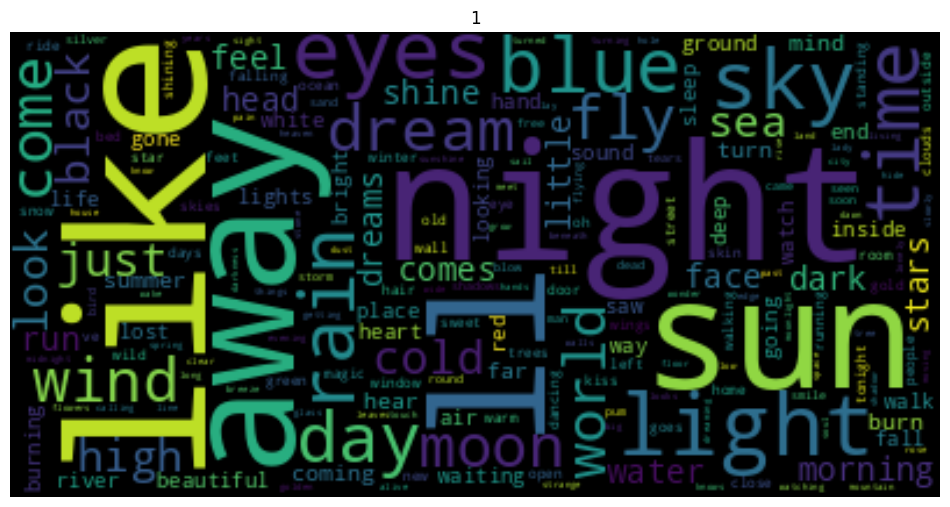

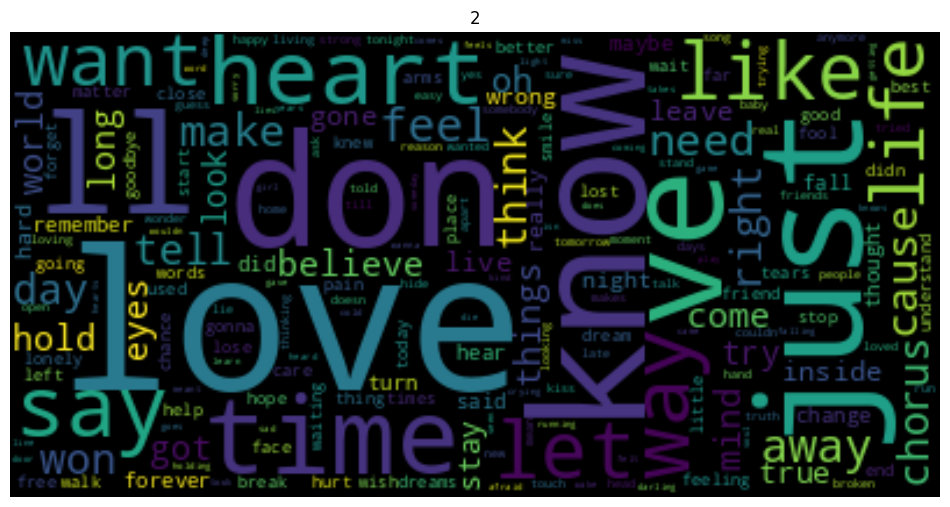

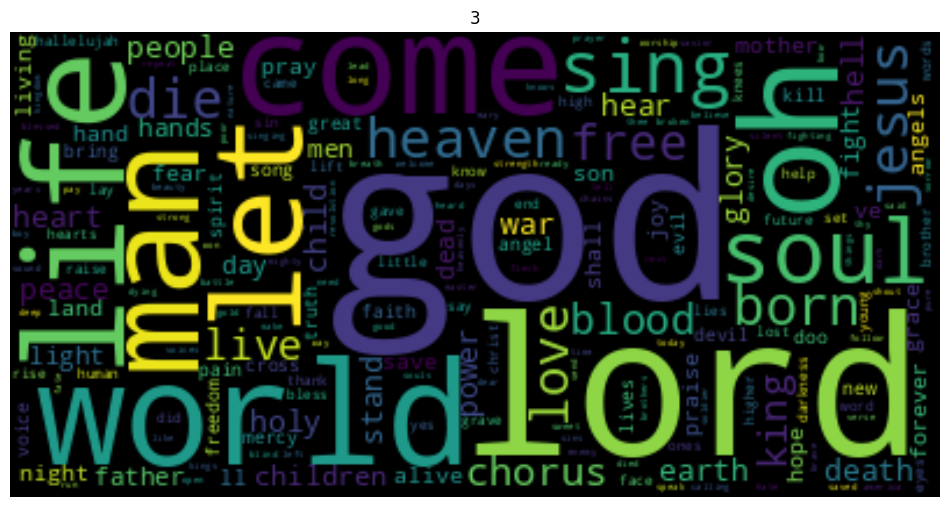

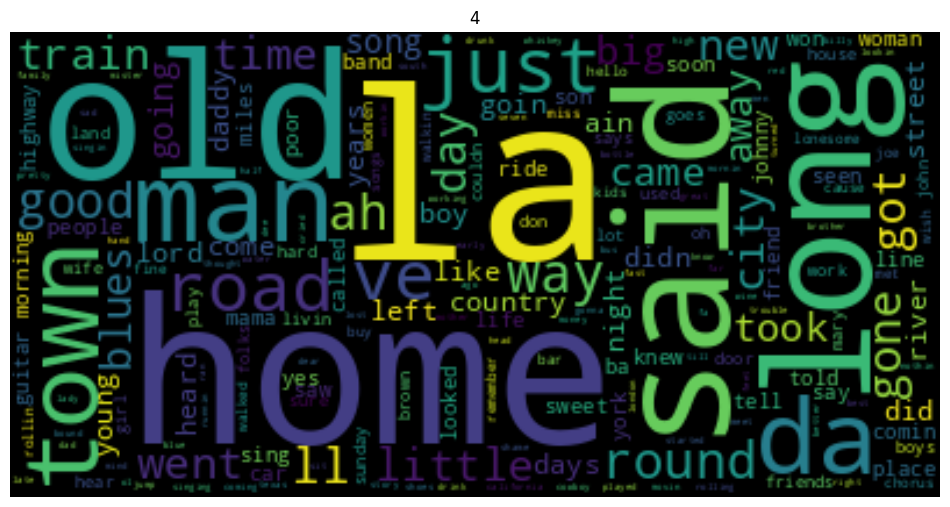

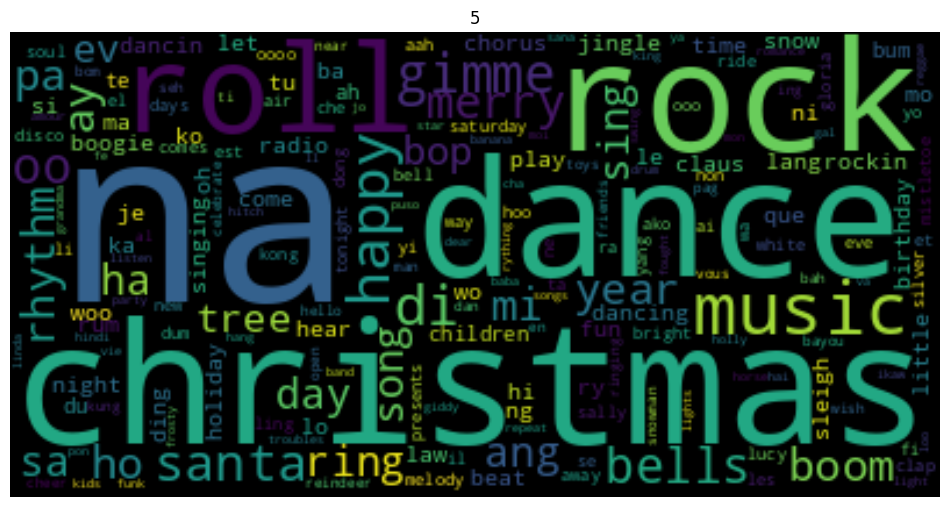

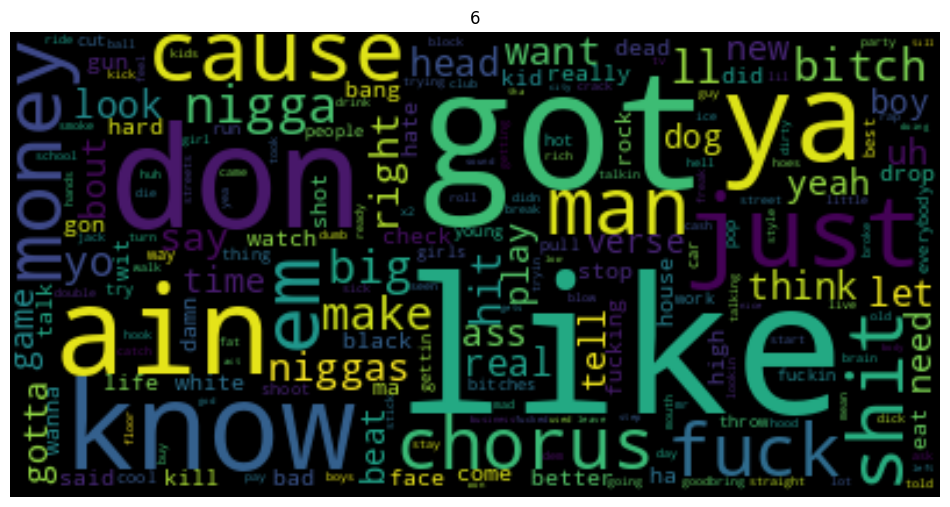

In [93]:
n=0
for topic in topics:
    wordcloud = WordCloud()
    wordcloud.generate_from_frequencies(topic)
    plt.figure(figsize=(12,8), dpi=100)
    plt.title(n)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");
    n=n+1

In [96]:
n = 0
for topic in LDA.components_:
    print(n)
    print(keys[topic.argsort()][-15:])
    print('\n')
    n+=1

0
['let' 'love' 'hey' 'like' 'just' 'come' 'girl' 'know' 'want' 'gonna'
 'don' 'got' 'yeah' 'baby' 'oh']


1
['fly' 'wind' 'dream' 'day' 'time' 'blue' 'rain' 'sky' 'eyes' 'light'
 'away' 'sun' 'll' 'night' 'like']


2
['away' 'life' 'want' 'let' 'like' 'way' 'say' 'heart' 'time' 've' 'll'
 'just' 'don' 'know' 'love']


3
['love' 'born' 'die' 'jesus' 'heaven' 'sing' 'soul' 'let' 'man' 'oh'
 'life' 'come' 'world' 'lord' 'god']


4
['ll' 'ah' 'round' 'way' 've' 'road' 'just' 'town' 'da' 'man' 'long'
 'said' 'old' 'home' 'la']


5
['boom' 'year' 'merry' 'oo' 'bells' 'santa' 'gimme' 'di' 'happy' 'music'
 'roll' 'rock' 'dance' 'christmas' 'na']


6
['nigga' 'chorus' 'fuck' 'shit' 'man' 'em' 'money' 'cause' 'just' 'ya'
 'know' 'ain' 'don' 'got' 'like']




In [97]:
data['topic_raw'] = LDA.transform(dtm).argmax(axis=1)

In [98]:
topics = {0: 'Love'
          , 1: 'Nature'
          , 2: 'Life'
          , 3: 'Religion'
          , 4: 'Home'
          , 5: 'Holiday'
          , 6: 'Gangster Stuff'
         }

In [99]:
data['topic'] = data.topic_raw.apply(lambda x: topics[x])
data.head()

,artist,song,link,text,topic_raw,topic
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA...",2,Life
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen...",2,Life
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...,2,Life
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...,5,Holiday
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...,2,Life


In [101]:
sample =  data.sample(2)
for topic, text in zip(sample.topic, sample.text):
    print(topic)
    print(text, end='\n\n')

Love
Way down yonder, in New Orleans  
In the land of the dreamy scenes  
It's a garden of Eden, you know what I mean  
  
Creole babies with lovin' eyes  
Softly whisper their tender sighs  
Stop, ya bet your life you'll linger there, a little while  
Stop, won't you give your lady fair, a little smile?  
  
It's the heaven right here on earth  
All the beautiful queens  
Way down yonder, in New Orleans  
  
Stop, won't you give your lady fair, a little smile?  
Stop, give lady fair, a little smile  
Oh!  
It's the heaven right here on earth  
All the beautiful queens  
Look out!  
Way down yonder, in New Orleans



Life
I want you, I want you  
I want you, I want you  
I want you, I want you  
  
Let me introduce myself  
Let me introduce myself  
Let me introduce myself  
  
Lookin' in your eyes makes me wonder how  
I got so much time with you and there's more around  
I know all the competition that's after you  
So I get to thinking, is this too good to be true?  
  
That we're l

### NMF

In [103]:
tfidf = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = tfidf.fit_transform(text_data)

In [104]:
nmf_model = NMF(n_components=7,random_state=42, verbose=1, max_iter=1000)
nmf_model.fit(dtm)

violation: 1.0
violation: 0.30062788338468843
violation: 0.19350741563365065
violation: 0.1392311659512925
violation: 0.10473001067483534
violation: 0.07802607631873662
violation: 0.0601215107152229
violation: 0.04817842942580896
violation: 0.0394390514673242
violation: 0.0331848701581168
violation: 0.02864047717028193
violation: 0.024649780229947692
violation: 0.02119131816915963
violation: 0.018609224418919695
violation: 0.016507931534240444
violation: 0.01470470793547237
violation: 0.013131713286805029
violation: 0.011756028270452454
violation: 0.010504588263135411
violation: 0.009386182492203073
violation: 0.008392643607930138
violation: 0.007491754914405791
violation: 0.006672828325421376
violation: 0.005914649113866545
violation: 0.005198297191601817
violation: 0.004465685402135409
violation: 0.0039528776899245685
violation: 0.0035135393701186996
violation: 0.003138620117844377
violation: 0.002818433866129801
violation: 0.002543947150834675
violation: 0.0023056358482438496
violat

NMF(max_iter=1000, n_components=7, random_state=42, verbose=1)

In [115]:
print(tfidf.get_feature_names_out().shape, nmf_model.components_[0].shape)
keys = tfidf.get_feature_names_out()

(40546,) (40546,)


In [124]:
topics = []
for topic in nmf_model.components_:
    d  = {}
    for key, value in zip(keys, topic):
        d[key] = value
    topics.append(d)

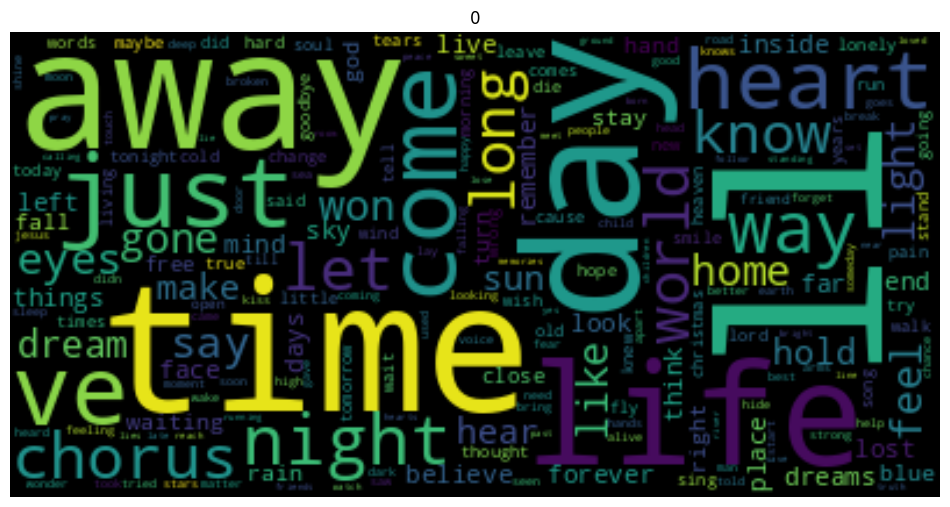

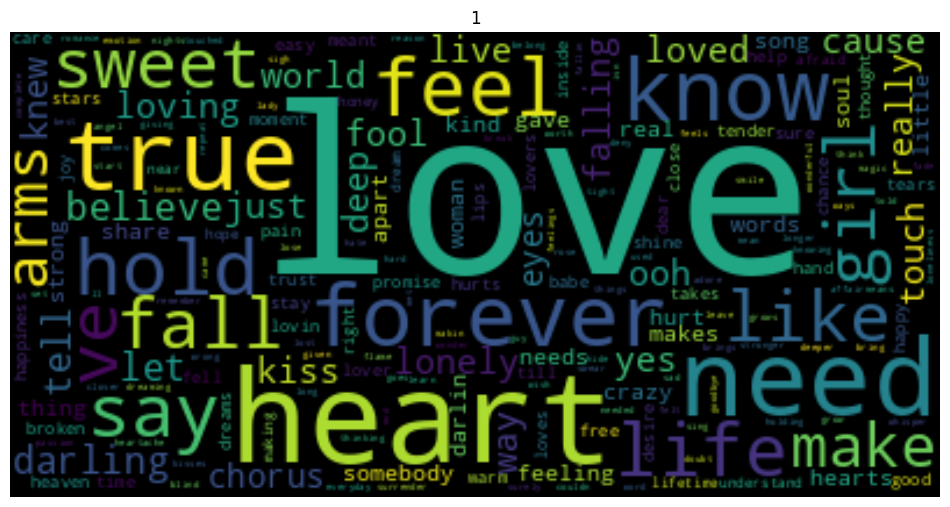

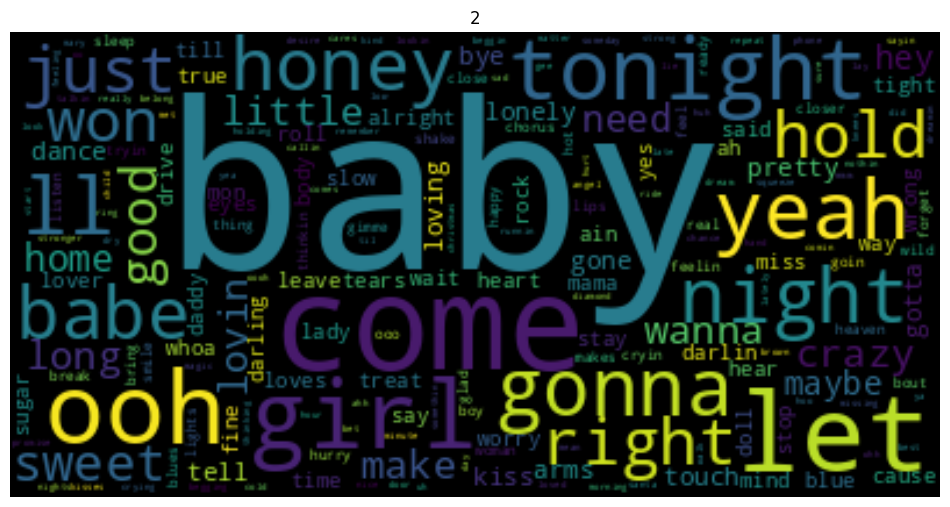

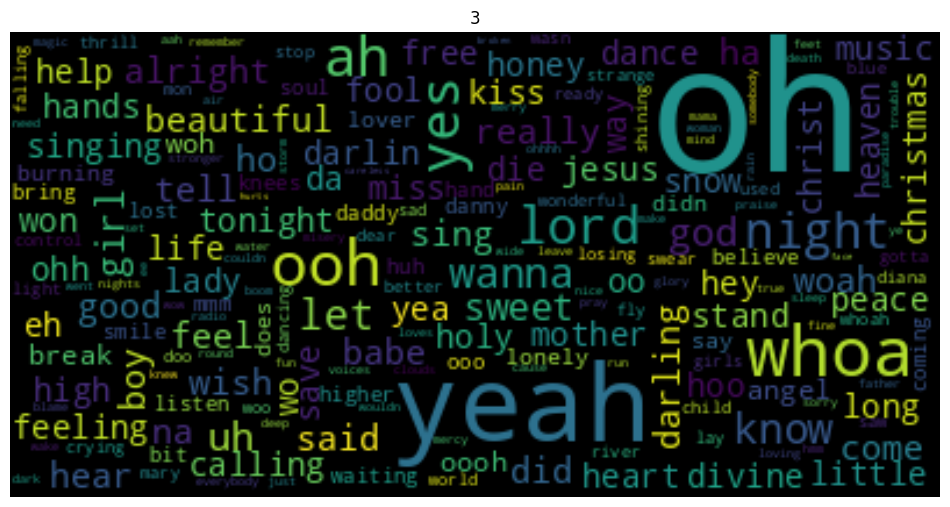

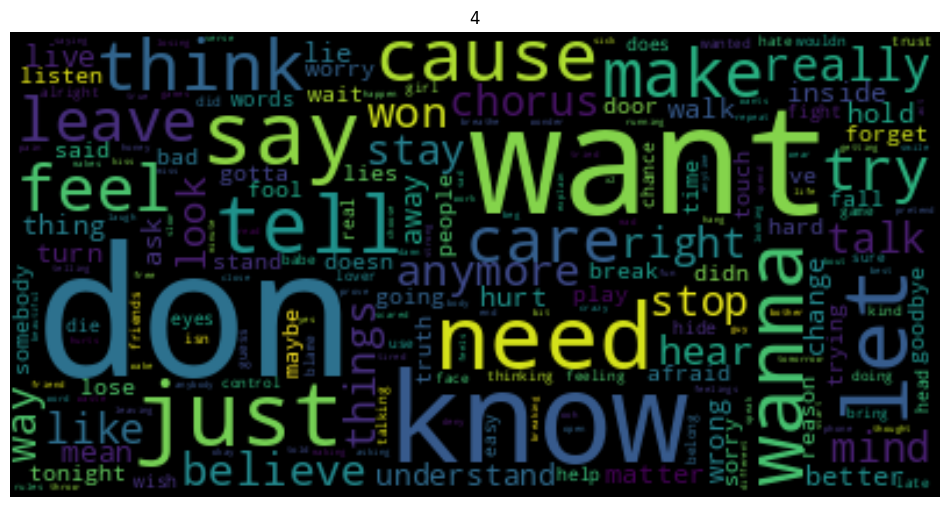

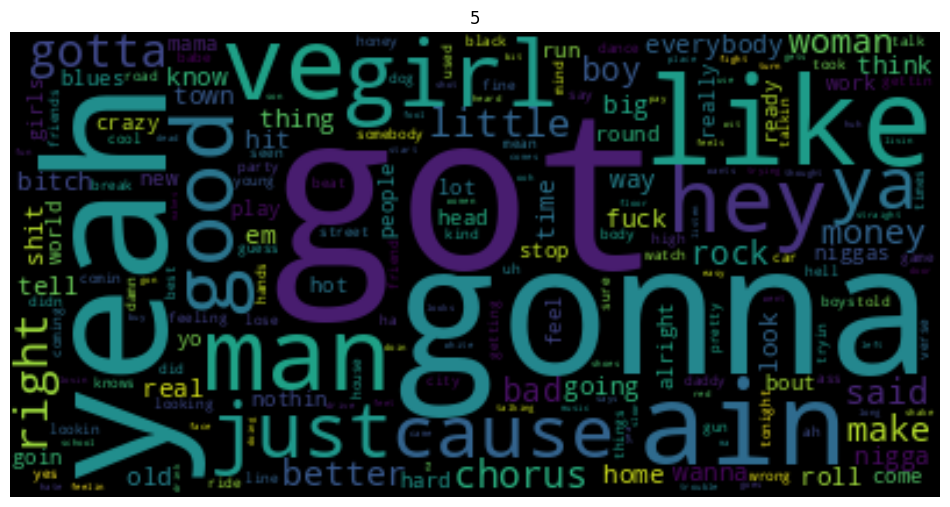

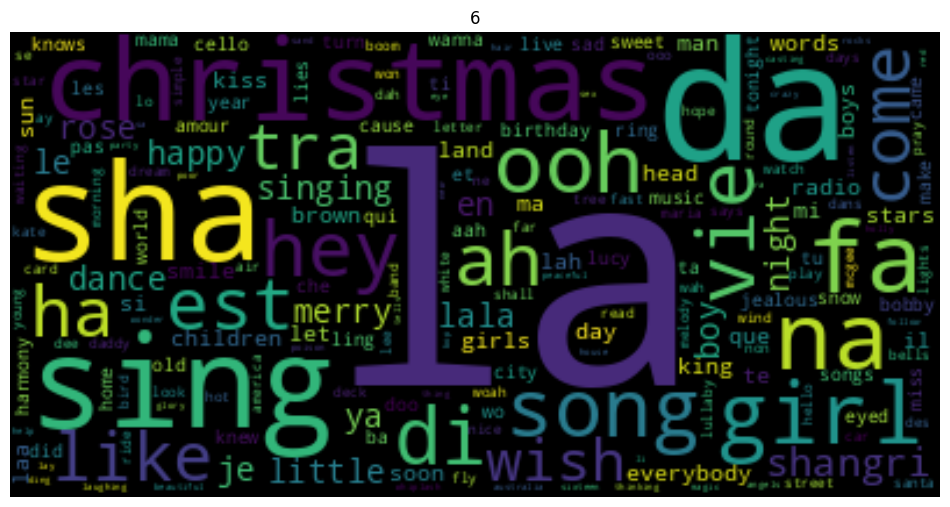

In [125]:
n=0
for topic in topics:
    wordcloud = WordCloud()
    wordcloud.generate_from_frequencies(topic)
    plt.figure(figsize=(12,8), dpi=100)
    plt.title(n)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");
    n=n+1

In [127]:
n = 0
for topic in LDA.components_:
    print(n)
    print(keys[topic.argsort()][-15:])
    print('\n')
    n+=1

0
['let' 'love' 'hey' 'like' 'just' 'come' 'girl' 'know' 'want' 'gonna'
 'don' 'got' 'yeah' 'baby' 'oh']


1
['fly' 'wind' 'dream' 'day' 'time' 'blue' 'rain' 'sky' 'eyes' 'light'
 'away' 'sun' 'll' 'night' 'like']


2
['away' 'life' 'want' 'let' 'like' 'way' 'say' 'heart' 'time' 've' 'll'
 'just' 'don' 'know' 'love']


3
['love' 'born' 'die' 'jesus' 'heaven' 'sing' 'soul' 'let' 'man' 'oh'
 'life' 'come' 'world' 'lord' 'god']


4
['ll' 'ah' 'round' 'way' 've' 'road' 'just' 'town' 'da' 'man' 'long'
 'said' 'old' 'home' 'la']


5
['boom' 'year' 'merry' 'oo' 'bells' 'santa' 'gimme' 'di' 'happy' 'music'
 'roll' 'rock' 'dance' 'christmas' 'na']


6
['nigga' 'chorus' 'fuck' 'shit' 'man' 'em' 'money' 'cause' 'just' 'ya'
 'know' 'ain' 'don' 'got' 'like']




In [129]:
data['topic_raw'] = LDA.transform(dtm).argmax(axis=1)

In [130]:
topics = {0: 'Woman'
          , 1: 'Nature'
          , 2: 'Love'
          , 3: 'Religion'
          , 4: 'Home'
          , 5: 'Holiday'
          , 6: 'Gangster Stuff'
         }

In [131]:
data['topic'] = data.topic_raw.apply(lambda x: topics[x])
data.head()

,artist,song,link,text,topic_raw,topic
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA...",1,Nature
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen...",1,Nature
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...,6,Gangster Stuff
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...,5,Holiday
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...,5,Holiday


In [137]:
sample =  data.sample(2)
for topic, text in zip(sample.topic, sample.text):
    print(topic)
    print(text, end='\n\n')

Gangster Stuff
Some kinda love, Margarita told Tom  
Between thought and expression lies a lifetime  
Situation arise, because of the weather  
And no kinds of love are better than others  
  
Some kinda love, Margarita told Tom  
Like a dirty French novel, the absurd court the vulgar  
And some kinds of love, the possibilities are endless  
And for me to miss one would seem to be groundless  
  
I heard what you said, Margarita heard Tom  
And of course you're a bore  
But you are not charmless in  
'Cause a bore is a straight line  
That finds wealth in division  
And some kinds of love are mistaken for vision  
  
Put jelly on your shoulder, let's do what you feel most  
That, from which you recoil, but which still makes your eyes moist  
Ooooh, put jelly on your shoulder, lies down upon the carpet  
Between thought and expression, let us now kiss the culprit  
Ooooh, I don't know, just what it's all about  
Oooh, put on your red pajamas and let's find out  
Lord rock it on, long wa

# Women's Clothing

In [2]:
data = pd.read_csv('Womens Clothing E-Commerce Reviews.csv')
data.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [3]:
text_data = data['Review Text'].astype(str)

Of course there is no topic to the artical or category for that matter thus we would need to set it ourselves 

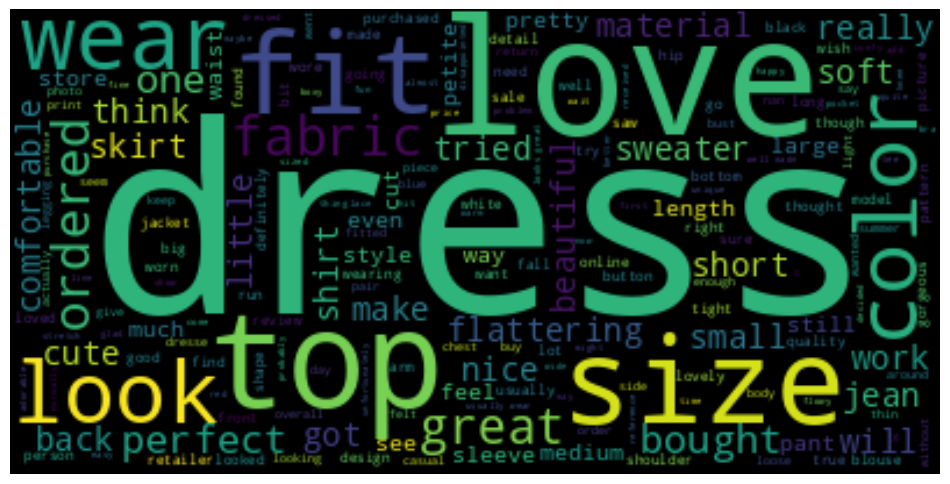

In [4]:
# Get all the text
text = ' '.join(text_data)
wordcloud = WordCloud().generate(text)

# Plot Word Cloud
plt.figure(figsize=(12,8), dpi=100)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");

## Preprocessing

**`max_df`**` : float in range [0.0, 1.0] or int, default=1.0`<br>
When building the vocabulary ignore terms that have a document frequency strictly higher than the given threshold (corpus-specific stop words). If float, the parameter represents a proportion of documents, integer absolute counts. This parameter is ignored if vocabulary is not None.

**`min_df`**` : float in range [0.0, 1.0] or int, default=1`<br>
When building the vocabulary ignore terms that have a document frequency strictly lower than the given threshold. This value is also called cut-off in the literature. If float, the parameter represents a proportion of documents, integer absolute counts. This parameter is ignored if vocabulary is not None.

In [5]:
cv = CountVectorizer(max_df=0.95, min_df=10, stop_words='english')
dtm = cv.fit_transform(text_data)

## Fitting the Data

In [6]:
LDA = LatentDirichletAllocation(n_components=7
                                , random_state=42
                                , n_jobs=-1
                                , verbose=1
                                , max_iter=20).fit(dtm)

iteration: 1 of max_iter: 20
iteration: 2 of max_iter: 20
iteration: 3 of max_iter: 20
iteration: 4 of max_iter: 20
iteration: 5 of max_iter: 20
iteration: 6 of max_iter: 20
iteration: 7 of max_iter: 20
iteration: 8 of max_iter: 20
iteration: 9 of max_iter: 20
iteration: 10 of max_iter: 20
iteration: 11 of max_iter: 20
iteration: 12 of max_iter: 20
iteration: 13 of max_iter: 20
iteration: 14 of max_iter: 20
iteration: 15 of max_iter: 20
iteration: 16 of max_iter: 20
iteration: 17 of max_iter: 20
iteration: 18 of max_iter: 20
iteration: 19 of max_iter: 20
iteration: 20 of max_iter: 20


In [7]:
print(cv.get_feature_names_out().shape, LDA.components_.shape)
keys = cv.get_feature_names_out()

(3193,) (7, 3193)


In [8]:
topics = []
for topic in LDA.components_:
    d  = {}
    for key, value in zip(keys, topic):
        d[key] = value
    topics.append(d)

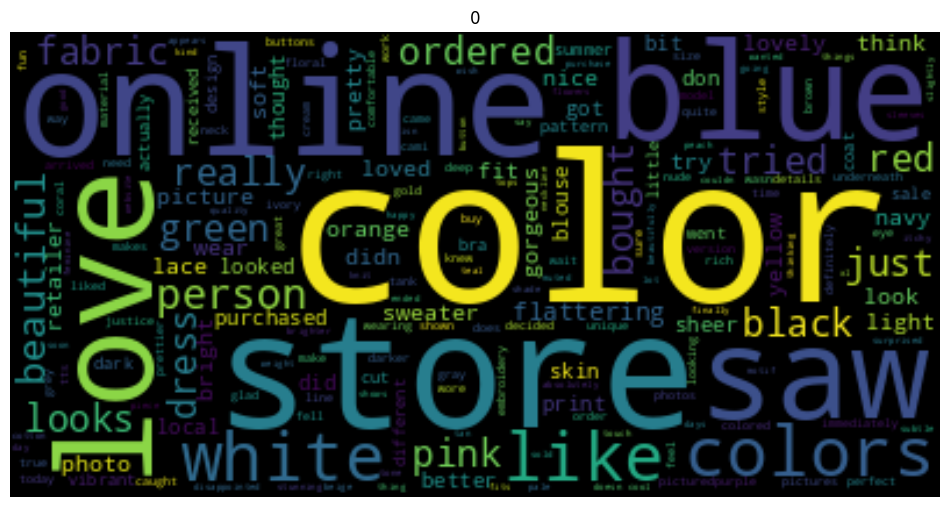

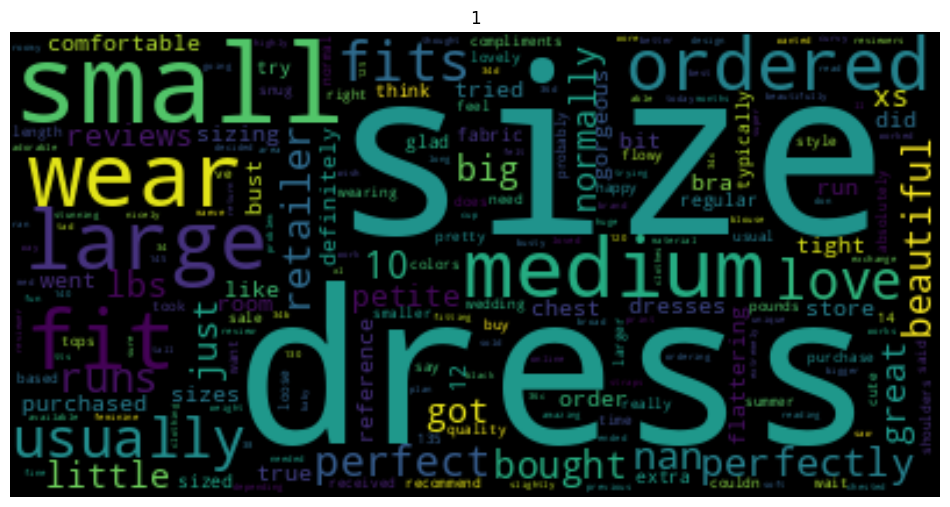

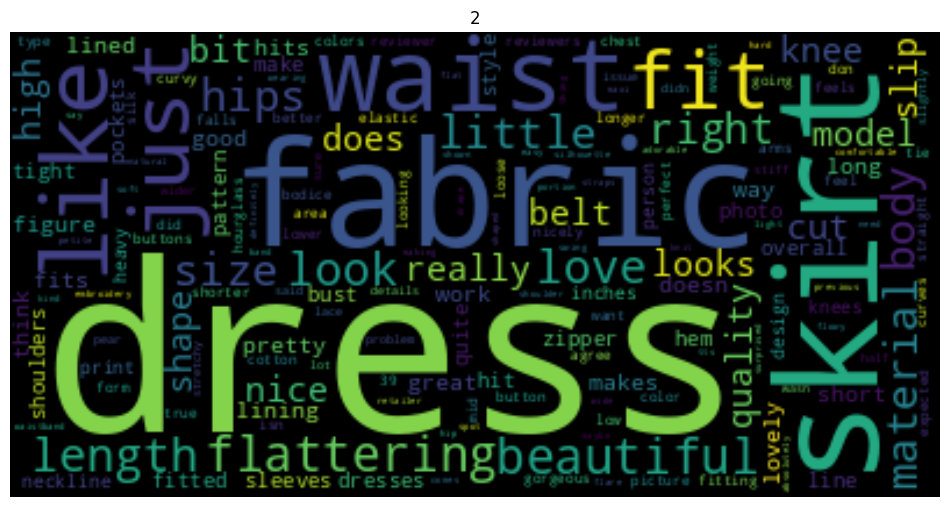

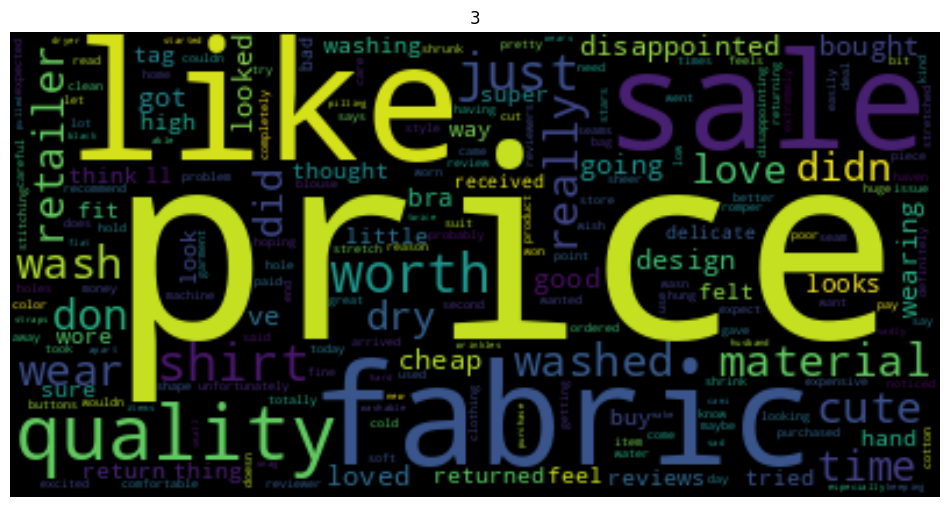

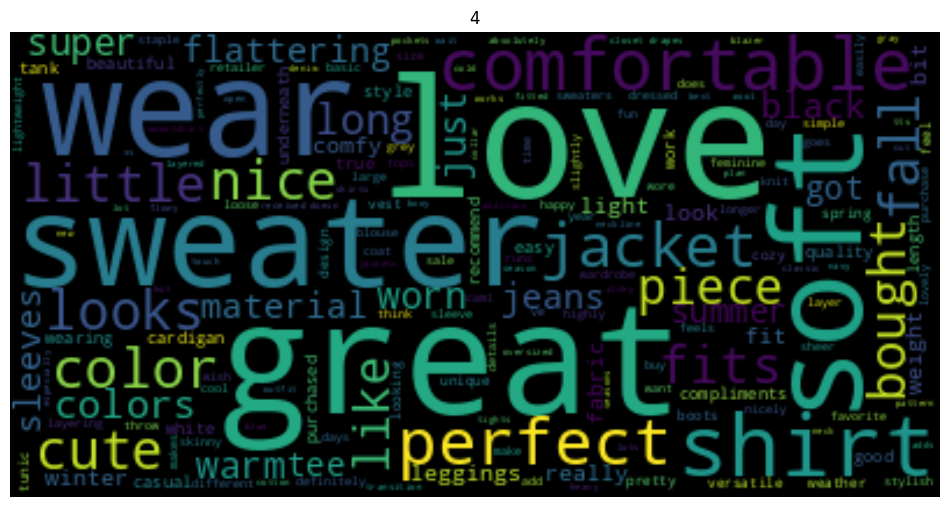

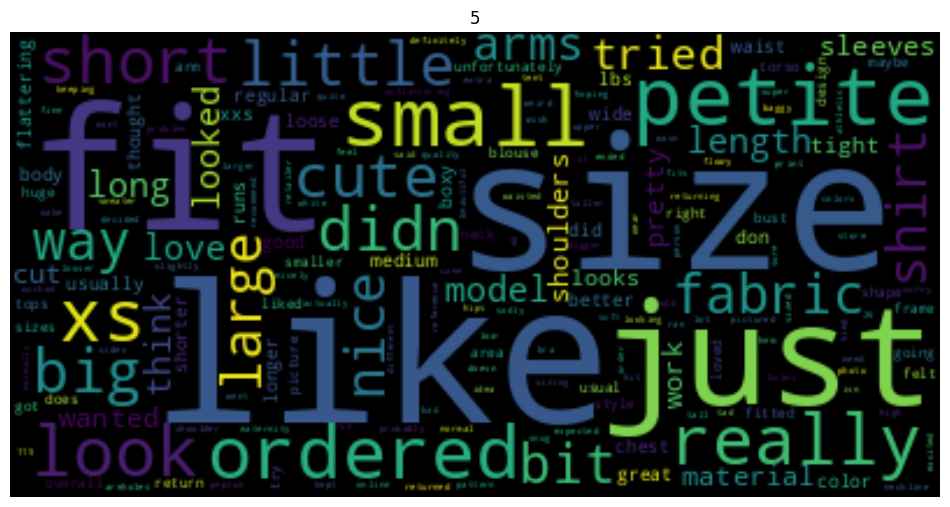

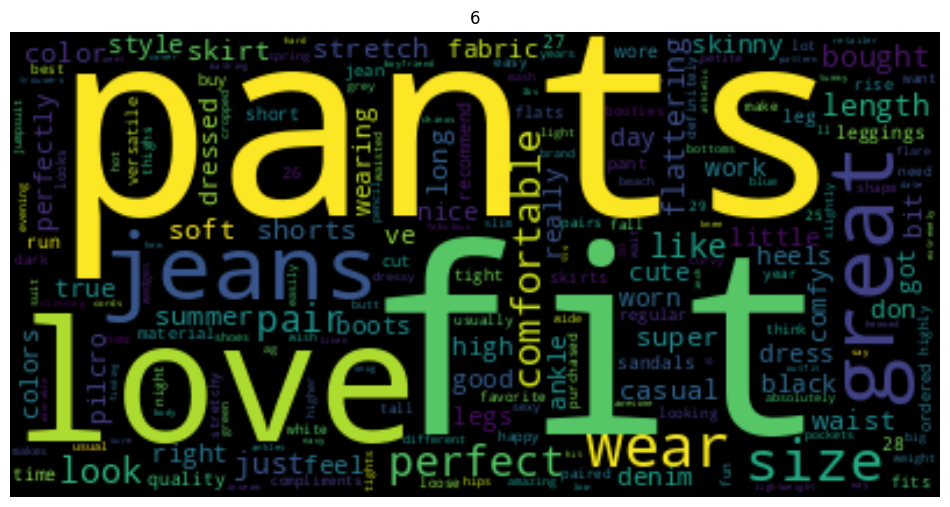

In [9]:
n=0
for topic in topics:
    wordcloud = WordCloud()
    wordcloud.generate_from_frequencies(topic)
    plt.figure(figsize=(12,8), dpi=100)
    plt.title(n)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");
    n=n+1

In [10]:
n = 0
for topic in LDA.components_:
    print(n)
    value = keys[topic.argsort()][-10:] 
    value = list(value)
    # value.remove('https')
    # value.remove('pain')
    print(value)
    print('\n')
    n+=1

0
['person', 'white', 'like', 'colors', 'saw', 'love', 'blue', 'online', 'store', 'color']


1
['fits', 'usually', 'ordered', 'large', 'fit', 'medium', 'wear', 'small', 'dress', 'size']


2
['look', 'beautiful', 'flattering', 'fit', 'just', 'like', 'waist', 'skirt', 'fabric', 'dress']


3
['washed', 'material', 'shirt', 'just', 'worth', 'quality', 'sale', 'fabric', 'like', 'price']


4
['color', 'jacket', 'perfect', 'comfortable', 'shirt', 'soft', 'sweater', 'wear', 'great', 'love']


5
['look', 'really', 'xs', 'ordered', 'small', 'petite', 'just', 'fit', 'size', 'like']


6
['pair', 'comfortable', 'perfect', 'size', 'wear', 'great', 'jeans', 'love', 'fit', 'pants']




In [11]:
data['topic_raw'] = LDA.transform(dtm).argmax(axis=1)
data[['Review Text', 'topic_raw']]

,Review Text,topic_raw
0,Absolutely wonderful - silky and sexy and comf...,6
1,Love this dress! it's sooo pretty. i happene...,1
2,I had such high hopes for this dress and reall...,2
3,"I love, love, love this jumpsuit. it's fun, fl...",6
4,This shirt is very flattering to all due to th...,4
...,...,...
23481,I was very happy to snag this dress at such a ...,4
23482,"It reminds me of maternity clothes. soft, stre...",5
23483,"This fit well, but the top was very see throug...",0
23484,I bought this dress for a wedding i have this ...,1


In [12]:
topics = {0: 'Color and online shopping'
          , 1: 'Dresses and their sizes'
          , 2: 'Well fitting'
          , 3: 'Material Quality'
          , 4: 'Sweater,  shirts and jakets'
          , 5: 'Small Sizes'
          , 6: 'Pants'
         }

In [13]:
data['topic'] = data.topic_raw.apply(lambda x: topics[x])
data[['Review Text', 'topic_raw', 'topic']]

,Review Text,topic_raw,topic
0,Absolutely wonderful - silky and sexy and comf...,6,Pants
1,Love this dress! it's sooo pretty. i happene...,1,Dresses and their sizes
2,I had such high hopes for this dress and reall...,2,Well fitting
3,"I love, love, love this jumpsuit. it's fun, fl...",6,Pants
4,This shirt is very flattering to all due to th...,4,"Sweater, shirts and jakets"
...,...,...,...
23481,I was very happy to snag this dress at such a ...,4,"Sweater, shirts and jakets"
23482,"It reminds me of maternity clothes. soft, stre...",5,Small Sizes
23483,"This fit well, but the top was very see throug...",0,Color and online shopping
23484,I bought this dress for a wedding i have this ...,1,Dresses and their sizes


In [16]:
sample =  data.sample(2)
for topic, text in zip(sample['topic'], sample['Review Text']):
    print(topic)
    print(text, end='\n\n')

Sweater,  shirts and jakets
Omg i love this sweater. it is minimalistic yet romantic. my mother in-law bought this for me last may when she was visiting and one for herself. i saw it today at the store in white and i snatched it up. i will wear this for years. i did not see until now that is is meant to be worn with the ties in the back. i've been wearing it with the ties in the front. what a bonus that there are 2 ways to wear this wonderful sweater. i will wear these 2 pieces for many, many years.

Color and online shopping
I ordered this in hopes of wearing as a tunic with leggings for my rehearsal dinner. it is much shorter than expected and wouldn't have looked right with leggings. it also was more gray than ivory and in the short time i had it on was shedding lint like crazy. beautiful in photos but didn't work for me.

